# Trivariate Analysis

### Importing Libraries

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

In [2]:
# Set Plotly default template
pio.templates.default = "plotly_white"

### Loading Datasets

In [3]:
df_enrolment = pd.read_parquet('enrolment_cleaned.parquet')
df_demographic = pd.read_parquet('demographic_cleaned.parquet')
df_biometric = pd.read_parquet('biometric_cleaned.parquet')

### Geography x Time x Activity Distribution
##### To visualize how activity intensity changes over time across different states. This helps identify when specific states started peaking or dropping off.

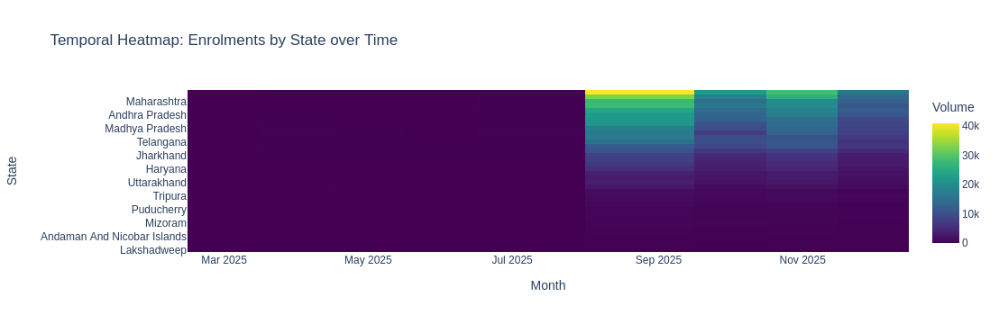

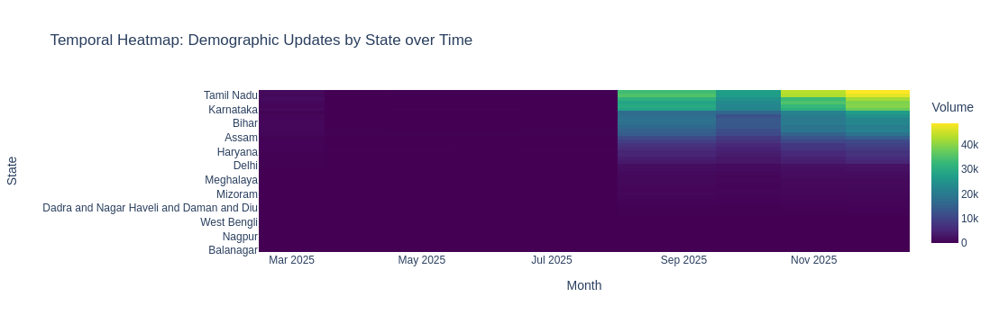

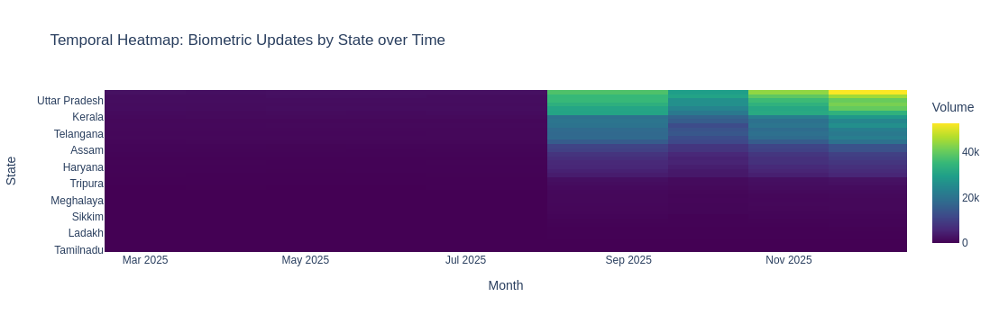

In [4]:
def plot_state_time_heatmap(df, activity_name):
    # 1. Aggregate by State and Month
    df['date'] = pd.to_datetime(df['date'])
    df['Month_Year'] = df['date'].dt.to_period('M').astype(str)
    
    heatmap_data = df.groupby(['state', 'Month_Year']).size().reset_index(name='Count')
    
    # 2. Pivot for Heatmap format (Rows=State, Cols=Time, Val=Count)
    heatmap_pivot = heatmap_data.pivot(index='state', columns='Month_Year', values='Count').fillna(0)
    
    # 3. Sort States by total volume for better readability
    heatmap_pivot['Total'] = heatmap_pivot.sum(axis=1)
    heatmap_pivot = heatmap_pivot.sort_values('Total', ascending=True).drop(columns='Total')
    
    # 4. Plot
    fig = px.imshow(
        heatmap_pivot,
        aspect="auto",
        color_continuous_scale="Viridis",
        title=f"Temporal Heatmap: {activity_name} by State over Time",
        labels=dict(x="Month", y="State", color="Volume"),
        origin='lower' # Matches standard plot orientation
    )
    fig.show()

# Visualize trends
plot_state_time_heatmap(df_enrolment, "Enrolments")
plot_state_time_heatmap(df_demographic, "Demographic Updates")
plot_state_time_heatmap(df_biometric, "Biometric Updates")

### Geography x Age x Activity
##### To see where specific age groups are most active.

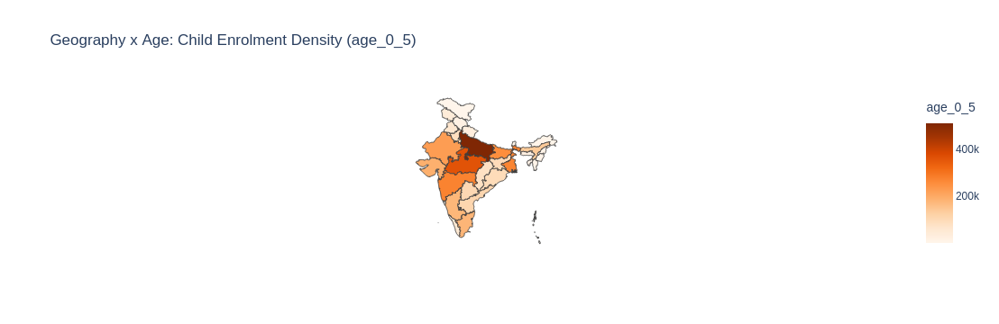

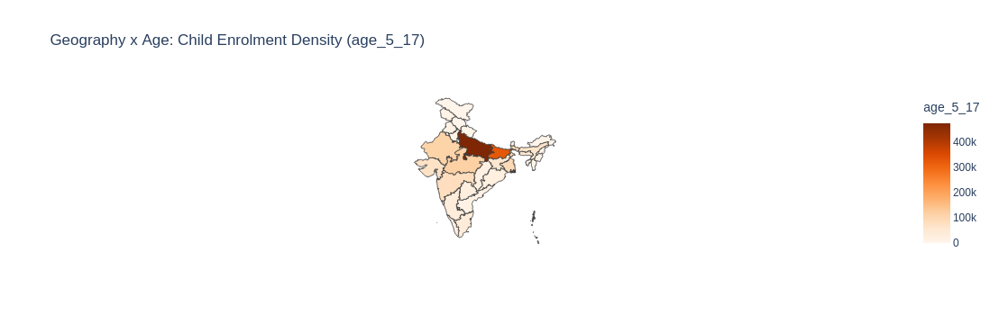

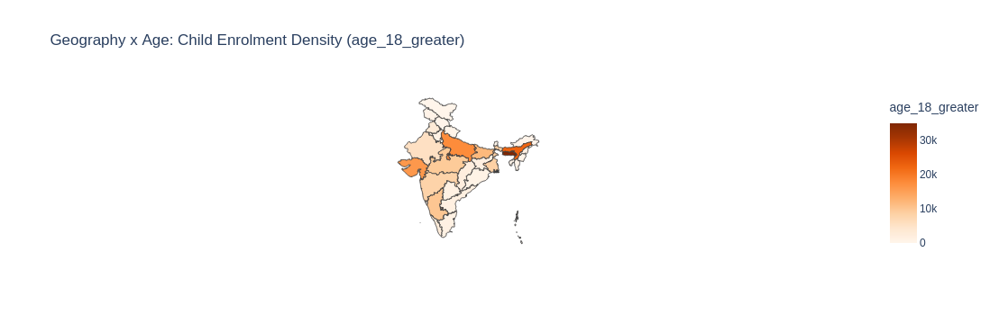

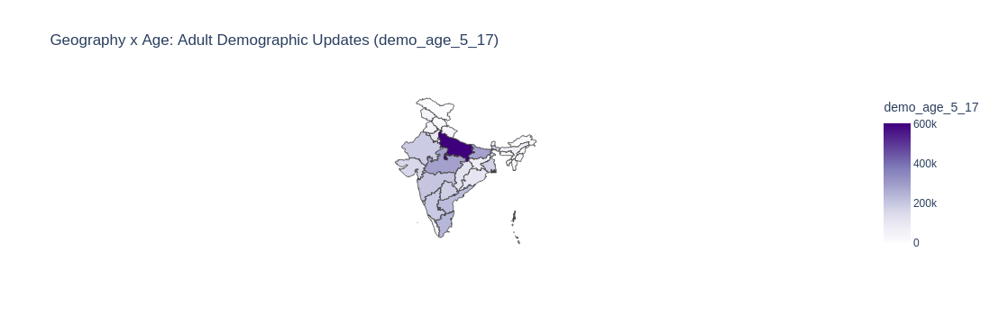

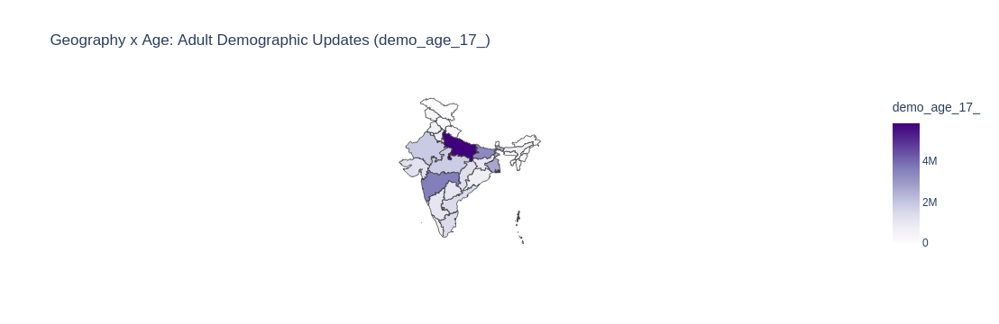

In [17]:
import plotly.express as px
import requests

# 1. Load the high-quality GeoJSON (includes Ladakh, Delhi, etc.)
geo_url = "https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson"
response = requests.get(geo_url)
india_geojson = response.json()

def plot_age_geography_map(df, age_col, dataset_name, color_scale="Magma"):
    """
    Plots a Choropleth map for a specific age column (Geography x Age x Activity).
    """
    
    # 1. Standardize State Names (CRITICAL STEP)
    # Using the same mapping to ensure alignment with GeoJSON 'ST_NM'
    state_mapping = {
        'Andaman And Nicobar Islands': 'Andaman & Nicobar',
        'Arunachal Pradesh': 'Arunachal Pradesh',
        'Dadra and Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
        'Daman and Diu': 'Dadra and Nagar Haveli and Daman and Diu',
        'Jammu And Kashmir': 'Jammu & Kashmir',
        'Odisha': 'Odisha',
        'Telangana': 'Telangana',
        'Ladakh': 'Ladakh',
        'Lakshadweep': 'Lakshadweep',
    }
    
    df_map = df.copy()
    df_map['State_Map_Name'] = df_map['state'].replace(state_mapping)
    
    # 2. Check if the requested Age Column exists
    if age_col not in df_map.columns:
        print(f"Column '{age_col}' not found. Available columns: {df_map.columns.tolist()}")
        return

    # 3. Aggregate Data: Sum the specific Age count by State
    state_age_counts = df_map.groupby('State_Map_Name')[age_col].sum().reset_index()
    
    # 4. Create the Map
    fig = px.choropleth(
        state_age_counts,
        geojson=india_geojson,
        locations='State_Map_Name',
        featureidkey="properties.ST_NM",
        color=age_col,
        color_continuous_scale=color_scale,
        title=f"Geography x Age: {dataset_name} ({age_col})",
        hover_name='State_Map_Name'
    )
    
    # Center and Zoom
    fig.update_geos(fitbounds="locations", visible=False)
    fig.show()

# --- EXAMPLES TO RUN ---

# 1. Visualize Child Enrolments (0-5 Years) - usually the most insightful map
# (Check your column name: might be 'Age_0_5', '0-5', or similar)
plot_age_geography_map(df_enrolment, 'age_0_5', "Child Enrolment Density", "Oranges")
plot_age_geography_map(df_enrolment, 'age_5_17', "Child Enrolment Density", "Oranges")
plot_age_geography_map(df_enrolment, 'age_18_greater', "Child Enrolment Density", "Oranges")

# 2. Visualize Adult Updates (18+)
plot_age_geography_map(df_demographic, 'demo_age_5_17', "Adult Demographic Updates", "Purples")
plot_age_geography_map(df_demographic, 'demo_age_17_', "Adult Demographic Updates", "Purples")

### State x District x Update
##### A hierarchical view to see which Districts within a State are driving the most Biometric vs Demographic updates.

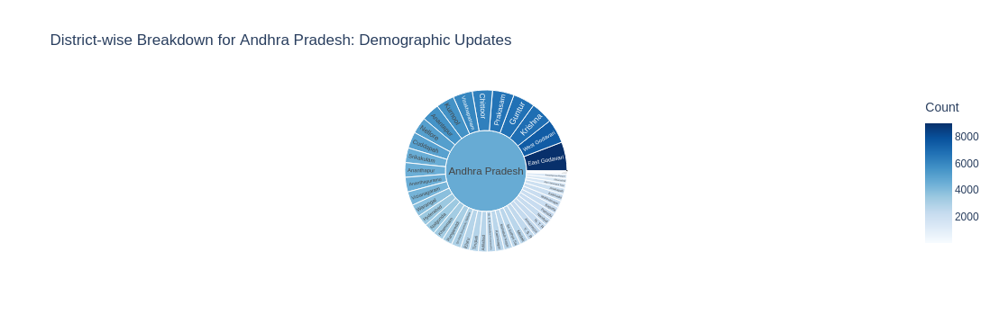

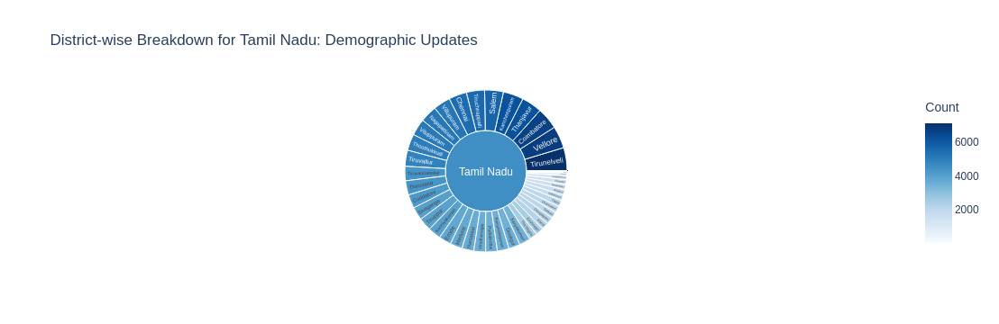

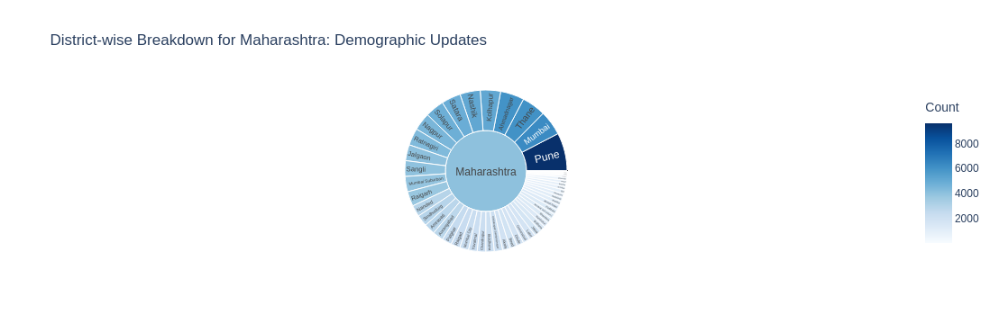

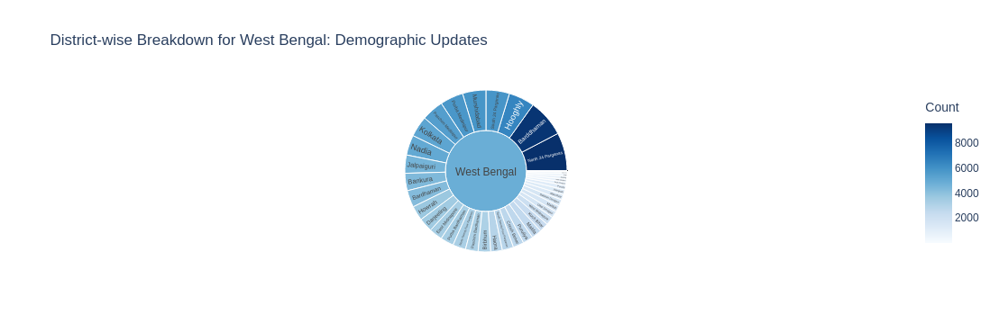

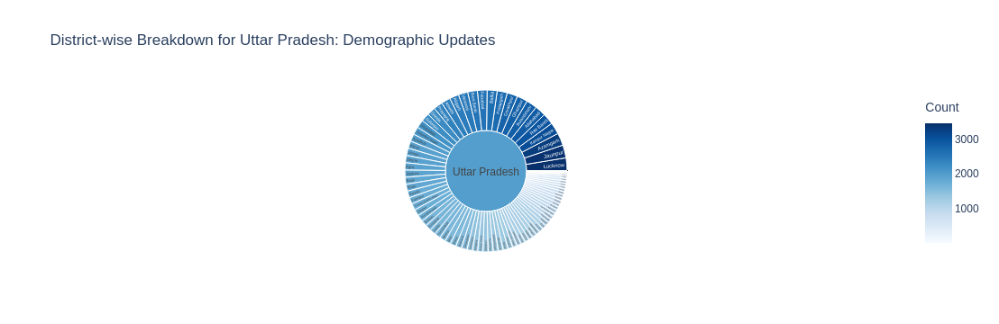

In [18]:
def plot_hierarchical_sunburst(df, state_name, title):
    # Filter for a specific state to keep the chart readable
    df_state = df[df['state'] == state_name]
    
    # Aggregate by District and (implicitly) Update Type if we merged datasets
    # For a single dataset, we can just view District breakdown
    
    district_counts = df_state.groupby('district').size().reset_index(name='Count')
    
    # Add State column for hierarchy root
    district_counts['state'] = state_name
    
    fig = px.sunburst(
        district_counts,
        path=['state', 'district'],
        values='Count',
        title=f"District-wise Breakdown for {state_name}: {title}",
        color='Count',
        color_continuous_scale='Blues'
    )
    fig.show()

# Interactive Check: Pick a high-volume state (e.g., "Uttar Pradesh" or "Maharashtra")
plot_hierarchical_sunburst(df_demographic, "Andhra Pradesh", "Demographic Updates")
plot_hierarchical_sunburst(df_demographic, "Tamil Nadu", "Demographic Updates")
plot_hierarchical_sunburst(df_demographic, "Maharashtra", "Demographic Updates")
plot_hierarchical_sunburst(df_demographic, "West Bengal", "Demographic Updates")
plot_hierarchical_sunburst(df_demographic, "Uttar Pradesh", "Demographic Updates")

### Time x Age x Volume
##### To track how the age composition of the user base is changing over time

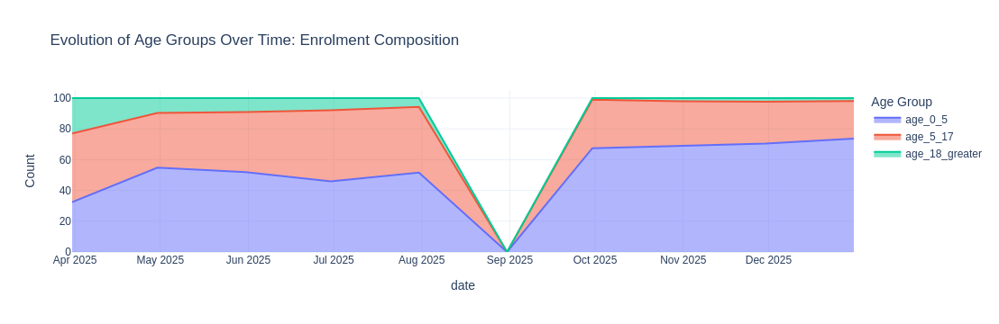

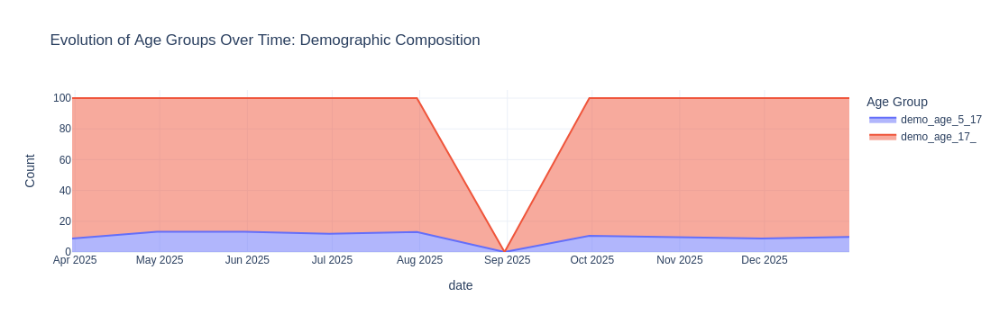

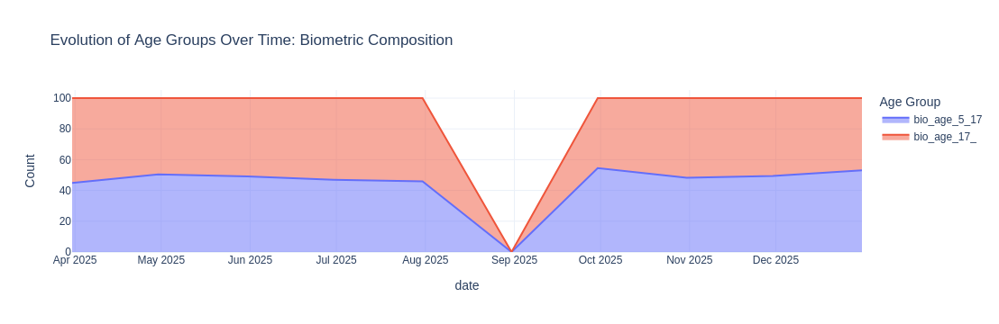

In [21]:
def plot_age_evolution(df, title):
    # 1. Resample to Weekly or Monthly frequency
    df['date'] = pd.to_datetime(df['date'])
    
    # Identify Age Columns
    age_cols = [c for c in df.columns if 'age' in c.lower()]
    
    # Resample and sum
    df_resampled = df.set_index('date')[age_cols].resample('ME').sum().reset_index()
    
    # Melt for Plotly (Long format)
    df_melted = df_resampled.melt(id_vars=['date'], value_vars=age_cols, var_name='Age Group', value_name='Count')
    
    # Area Chart
    fig = px.area(
        df_melted,
        x='date',
        y='Count',
        color='Age Group',
        title=f"Evolution of Age Groups Over Time: {title}",
        groupnorm='percent' # Optional: View as % share (normalized)
    )
    fig.show()

plot_age_evolution(df_enrolment, "Enrolment Composition")
plot_age_evolution(df_demographic, "Demographic Composition")
plot_age_evolution(df_biometric, "Biometric Composition")